In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
import sys

sys.path.append("..")

# Local Modules
from src.training import build_dataset, train_model

# Path to Dataset
DATA_DIR = "/media/gabriel/500 BKP/datasets/SNSD-DataSet/preprocessed"

# Dataset and loader
train_dataset, train_loader = build_dataset(DATA_DIR, split='train', target_frames=1024, batch_size = 16)
val_dataset, val_loader = build_dataset(DATA_DIR, split='validation', target_frames=1024, batch_size = 16)

Using device: cuda

🔁 Epoch 1/100


✅ Best model saved (val loss: 0.0319)

🎧 Previewing model output at epoch 0:


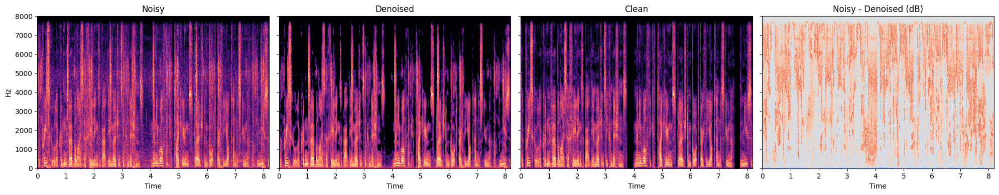

🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.0822 | Val Loss: 0.0319
🔧 Learning Rate: 0.001000

🔁 Epoch 2/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.0410 | Val Loss: 0.0330
🔧 Learning Rate: 0.001000

🔁 Epoch 3/100


✅ Best model saved (val loss: 0.0227)
📉 Train Loss: 0.0351 | Val Loss: 0.0227
🔧 Learning Rate: 0.001000

🔁 Epoch 4/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.0313 | Val Loss: 0.0236
🔧 Learning Rate: 0.001000

🔁 Epoch 5/100


✅ Best model saved (val loss: 0.0201)
📉 Train Loss: 0.0292 | Val Loss: 0.0201
🔧 Learning Rate: 0.001000

🔁 Epoch 6/100


✅ Best model saved (val loss: 0.0173)

🎧 Previewing model output at epoch 5:


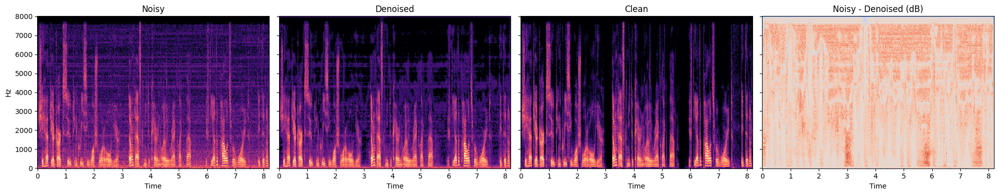

🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.0273 | Val Loss: 0.0173
🔧 Learning Rate: 0.001000

🔁 Epoch 7/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.0262 | Val Loss: 0.0197
🔧 Learning Rate: 0.001000

🔁 Epoch 8/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.0244 | Val Loss: 0.0209
🔧 Learning Rate: 0.001000

🔁 Epoch 9/100


Epoch 00009: reducing learning rate of group 0 to 1.0000e-04.
⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.0239 | Val Loss: 0.0175
🔧 Learning Rate: 0.000100

🔁 Epoch 10/100


⚠️  No improvement for 4 epoch(s)
📉 Train Loss: 0.0222 | Val Loss: 0.0177
🔧 Learning Rate: 0.000100

🔁 Epoch 11/100


⚠️  No improvement for 5 epoch(s)

🎧 Previewing model output at epoch 10:


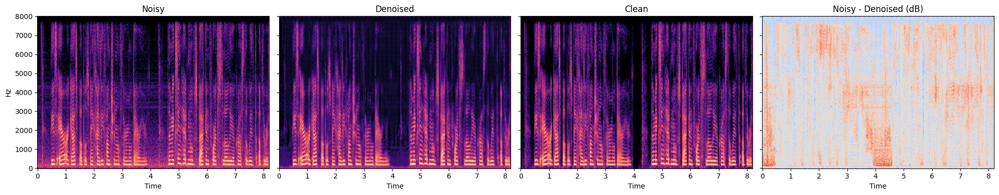

🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.0218 | Val Loss: 0.0175
🔧 Learning Rate: 0.000100

🔁 Epoch 12/100


Epoch 00012: reducing learning rate of group 0 to 1.0000e-05.
⚠️  No improvement for 6 epoch(s)
📉 Train Loss: 0.0217 | Val Loss: 0.0173
🔧 Learning Rate: 0.000010

🔁 Epoch 13/100


⚠️  No improvement for 7 epoch(s)
📉 Train Loss: 0.0215 | Val Loss: 0.0176
🔧 Learning Rate: 0.000010

🔁 Epoch 14/100


⚠️  No improvement for 8 epoch(s)
📉 Train Loss: 0.0215 | Val Loss: 0.0179
🔧 Learning Rate: 0.000010

🔁 Epoch 15/100


Epoch 00015: reducing learning rate of group 0 to 1.0000e-06.
⚠️  No improvement for 9 epoch(s)
📉 Train Loss: 0.0215 | Val Loss: 0.0178
🔧 Learning Rate: 0.000001

🔁 Epoch 16/100


⚠️  No improvement for 10 epoch(s)
⛔️ Early stopping triggered.


In [5]:
import torch
from torch import nn, optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Model
from src.model_unet import UNet

# Step 1: Detect device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Step 2: Create model and move to device
model = UNet(dropout_rate = 0.1).to(device)

# Step 3: Set up optimizer and loss
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Step 4: Set up learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',            # we're minimizing val loss
    factor=0.1,            # reduce LR by this factor (e.g. halve it)
    patience=2,            # wait this many epochs before reducing
    verbose=True           # print update info
)

# Step 5: Call training loop
model, train_losses, val_losses = train_model(
    model=model,
    optimizer=optimizer,
    criterion=criterion,
    scheduler=scheduler,
    device=device,
    train_loader=train_loader,
    train_dataset=train_dataset,
    val_loader=val_loader,
    val_dataset=val_dataset,
    num_epochs=100,
    early_stopping_patience=10,
    audio_preview=True
)

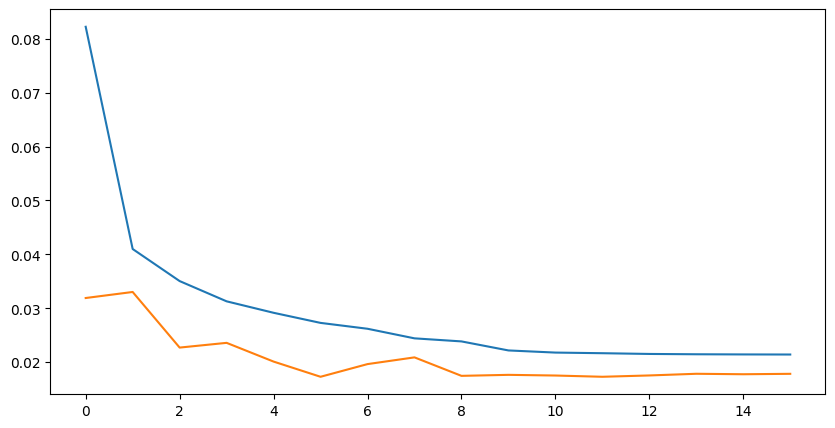

In [6]:
import matplotlib.pyplot as plt

# Plot training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')

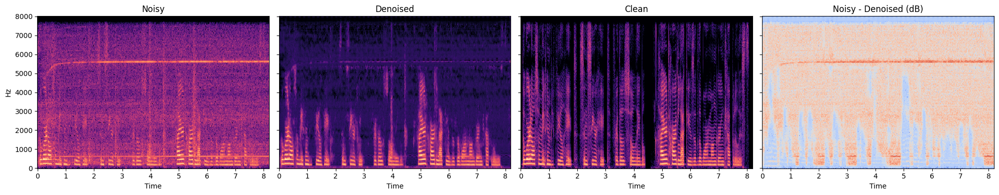

🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


In [7]:
from src.utils import play_denoised_sample, plot_spectrograms

play_denoised_sample(model, val_dataset, index=0)

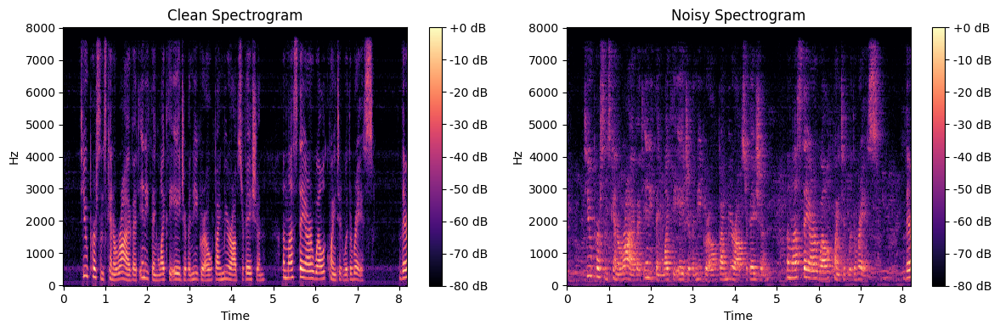

In [52]:
import librosa

plot_spectrograms(val_dataset[0][1], val_dataset[0][0])